## 1. Import Required Libraries

In [1]:
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib as mpl
from scipy.ndimage import gaussian_filter
import pandas as pd
import colormaps as cmaps
from matplotlib.colors import ListedColormap
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import matplotlib.gridspec as gridspec

# Set matplotlib defaults
plt.rcParams['font.size'] = 14
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14

print('Libraries imported successfully!')

Libraries imported successfully!


## 2. Configuration

Set the hemisphere, overlap type, and sources to visualize.

In [2]:
# Configuration
hemisphere  = 'nh'     # Options: 'nh', 'sh'
overlap_type = '3way'  # Options: 'isolated', 'mcs_only', 'ar_only', '3way', 'all'

# Sources to plot: (source_key, display_name)
# Layout: nrows=3, ncols=2
#   row1: era5, scream
#   row2: icon_d3hp003, nicam_gl11
#   row3: um_glm_n2560_RAL3p3, casesm2_10km_nocumulus
sources = [
    ('era5',                    'ERA5'),
    ('scream',                  'SCREAM'),
    ('icon_d3hp003',            'ICON'),
    ('nicam_gl11',              'NICAM'),
    ('um_glm_n2560_RAL3p3',     'UM'),
    ('casesm2_10km_nocumulus',  'CASESM2'),
]
nrows = 3
ncols = 2

# Data root (per-source sub-directory)
data_root = '/pscratch/sd/w/wcmca1/hackathon/etc_data/stats/'

# Figure output directory
figdir = '/global/cfs/cdirs/m1867/zfeng/hk25/figures_etc_composites/multipanel/'
os.makedirs(figdir, exist_ok=True)

hemisphere_name = 'Northern Hemisphere' if hemisphere == 'nh' else 'Southern Hemisphere'
overlap_names = {
    'isolated': 'Isolated ETC (no MCS/AR)',
    'mcs_only': 'ETC + MCS only',
    'ar_only':  'ETC + AR only',
    '3way':     'ETC + MCS + AR (3-way)',
    'all':      'All ETC',
}
overlap_desc = overlap_names.get(overlap_type, overlap_type)

print(f'Hemisphere:   {hemisphere_name}')
print(f'Overlap type: {overlap_desc}')
print(f'Sources:      {[s[1] for s in sources]}')
print(f'Layout:       {nrows} rows x {ncols} cols')
print(f'Output dir:   {figdir}')

Hemisphere:   Northern Hemisphere
Overlap type: ETC + MCS + AR (3-way)
Sources:      ['ERA5', 'SCREAM', 'ICON', 'NICAM', 'UM', 'CASESM2']
Layout:       3 rows x 2 cols
Output dir:   /global/cfs/cdirs/m1867/zfeng/hk25/figures_etc_composites/multipanel/


## 3. Load Data for All Sources

Load each source composite, compute derived variables (moisture flux, precipitation fractions).

In [3]:
min_pr_threshold = 2.4  # mm/day threshold for masking precipitation fractions

datasets = {}  # key: source_key -> xr.Dataset

for source_key, source_label in sources:
    composite_file = f'{data_root}/{source_key}/etc_2d_composite_{hemisphere}_{overlap_type}.nc'
    if not os.path.exists(composite_file):
        print(f'  [MISSING] {source_label}: {composite_file}')
        datasets[source_key] = None
        continue

    ds = xr.open_dataset(composite_file)

    # --- Moisture flux at 850 hPa ---
    hus_kgkg = ds['hus_850hPa'] / 1000.0
    ds['qu_850hPa'] = ds['ua_850hPa'] * hus_kgkg
    ds['qv_850hPa'] = ds['va_850hPa'] * hus_kgkg

    # --- Convert precipitation mm/h -> mm/day ---
    for pvar in ['pr', 'pr_mcs', 'pr_ar']:
        if pvar in ds:
            ds[pvar] = ds[pvar] * 24.0

    # --- Moisture flux magnitude at 850 hPa ---
    ds['qmag_850hPa'] = np.sqrt(ds['qu_850hPa']**2 + ds['qv_850hPa']**2)

    # --- Precipitation fractions ---
    if 'pr_mcs' in ds and 'pr' in ds:
        pf_mcs = 100.0 * ds['pr_mcs'] / ds['pr']
        ds['prfrac_mcs'] = pf_mcs.where((pf_mcs >= 5) & (ds['pr'] > min_pr_threshold))
    if 'pr_ar' in ds and 'pr' in ds:
        pf_ar = 100.0 * ds['pr_ar'] / ds['pr']
        ds['prfrac_ar'] = pf_ar.where((pf_ar >= 5) & (ds['pr'] > min_pr_threshold))

    datasets[source_key] = ds
    print(f'  [OK] {source_label}: grid {len(ds.y)} x {len(ds.x)}')

print('\nAll sources loaded.')

  [OK] ERA5: grid 161 x 161
  [OK] SCREAM: grid 161 x 161
  [OK] ICON: grid 161 x 161
  [OK] NICAM: grid 161 x 161
  [OK] UM: grid 161 x 161
  [OK] CASESM2: grid 161 x 161

All sources loaded.


## 4. Helper Functions

In [4]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=256):
    """Return a truncated version of *cmap* spanning [minval, maxval]."""
    return mpl.colors.LinearSegmentedColormap.from_list(
        f'trunc({cmap.name},{minval:.2f},{maxval:.2f})',
        cmap(np.linspace(minval, maxval, n)))

print('Helper functions defined.')

Helper functions defined.


In [5]:
def plot_etc_composite_multipanel(
        ds_list,
        source_labels,
        nrows,
        ncols,
        # --- primary shaded variable ---
        shade_var='hus_850hPa',
        shade_levels=None,
        shade_cmap='GnBu',
        shade_scale=1.0,
        shade_alpha=1.0,
        shade_label=None,
        cbar_ticks=None,
        # --- secondary shaded variable (overlay) ---
        shade_var2=None,
        shade_levels2=None,
        shade_cmap2='YlGnBu',
        shade_scale2=1.0,
        shade_alpha2=0.9,
        shade_label2=None,
        cbar_ticks2=None,
        shade_levels2_thresh=None,
        shade_smooth2=0,
        # --- primary contour ---
        contour_var='zg_500hPa',
        contour_levels=None,
        contour_smooth=2,
        contour_lw=2.0,
        contour_cmap=None,
        contour_color='black',
        # --- second contour (e.g. AR freq) ---
        contour_var2=None,
        contour_levels2=None,
        contour_cmap2=None,
        contour_color2=None,
        contour_smooth2=0,
        contour_lw2=2.0,
        contour_var2_legend=None,
        # --- third contour (e.g. MCS freq) ---
        contour_var3=None,
        contour_levels3=None,
        contour_cmap3=None,
        contour_color3=None,
        contour_smooth3=0,
        contour_lw3=2.0,
        contour_var3_legend=None,
        # --- wind / moisture-flux vectors ---
        u_var='ua_850hPa',
        v_var='va_850hPa',
        vector_skip=8,
        quiverkey_length=10,
        quiverkey_unit=' m/s',
        quiver_scale=300,
        # --- aesthetics ---
        circle_radius=None,
        xlim=None,
        ylim=None,
        xlabel='Longitude offset (°)',
        ylabel='Latitude offset (°)',
        suptitle=None,
        figsize=(14, 16),
        dpi=150,
        figname=None,
        # --- layout tuning ---
        cbar_width_ratio=0.02,
        main_wspace=0.05,
        panel_hspace=0.30,
        panel_wspace=0.12,
        cbar_hspace=0.25,
        title_y=1.0,
):
    """
    Plot ETC composites for multiple sources in an M-row x N-column grid.

    Two shared vertical colorbars are placed to the right of the panel grid,
    each spanning half the total figure height:
      - top colorbar    → primary shaded variable (shade_var)
      - bottom colorbar → secondary shaded variable (shade_var2)

    Parameters
    ----------
    ds_list       : list of xr.Dataset (length == nrows * ncols; None entries skipped)
    source_labels : list of str, panel titles
    nrows, ncols  : grid dimensions
    """
    contour_fontsize = 8

    # Panel letter labels: (a), (b), (c), ...
    panel_letters = [f'({chr(ord("a") + i)})' for i in range(nrows * ncols)]

    # ------------------------------------------------------------------ #
    # Outer GridSpec: [panel-area | colorbar-area]
    # ------------------------------------------------------------------ #
    fig = plt.figure(figsize=figsize, dpi=dpi)
    gs_outer = gridspec.GridSpec(
        1, 2, figure=fig,
        width_ratios=[1, cbar_width_ratio],
        wspace=main_wspace,
    )

    # ------------------------------------------------------------------ #
    # Panel sub-GridSpec: nrows x ncols
    # ------------------------------------------------------------------ #
    gs_panels = gridspec.GridSpecFromSubplotSpec(
        nrows, ncols,
        subplot_spec=gs_outer[0, 0],
        hspace=panel_hspace,
        wspace=panel_wspace,
    )

    # ------------------------------------------------------------------ #
    # Colorbar sub-GridSpec: 2 rows (top = shade_var, bottom = shade_var2)
    # ------------------------------------------------------------------ #
    gs_cbars = gridspec.GridSpecFromSubplotSpec(
        2, 1,
        subplot_spec=gs_outer[0, 1],
        hspace=cbar_hspace,
    )
    cax_top    = fig.add_subplot(gs_cbars[0, 0])
    cax_bottom = fig.add_subplot(gs_cbars[1, 0])

    # Variables to hold the first mappables for colorbar creation
    cf_ref  = None   # primary
    cf2_ref = None   # secondary

    # ------------------------------------------------------------------ #
    # Draw each panel
    # ------------------------------------------------------------------ #
    for idx, (ds, label) in enumerate(zip(ds_list, source_labels)):
        row = idx // ncols
        col = idx % ncols
        ax = fig.add_subplot(gs_panels[row, col])

        panel_title = f'{panel_letters[idx]} {label}'

        if ds is None:
            ax.text(0.5, 0.5, f'{label}\n(no data)',
                    ha='center', va='center', transform=ax.transAxes, fontsize=11)
            ax.set_title(panel_title, fontweight='bold', loc='left', pad=4)
            continue

        # coordinate grid
        lat_res = ds.attrs.get('lat_res', 0.25)
        lon_res = ds.attrs.get('lon_res', 0.25)
        x = ds.x.values * lon_res
        y = ds.y.values * lat_res
        X, Y = np.meshgrid(x, y)

        # ---- 1. Primary shaded variable ----
        if shade_var in ds:
            shade_data = ds[shade_var].values * shade_scale
            if shade_levels is None:
                vmin, vmax = np.nanpercentile(shade_data, [2, 98])
                _levels = np.linspace(vmin, vmax, 20)
            else:
                _levels = shade_levels
            cf = ax.contourf(X, Y, shade_data, levels=_levels,
                             cmap=shade_cmap, extend='both',
                             alpha=shade_alpha, antialiased=True, zorder=0)
            if cf_ref is None:
                cf_ref = cf

        # ---- 2. Secondary shaded variable ----
        if shade_var2 is not None and shade_var2 in ds:
            shade_data2 = ds[shade_var2].values * shade_scale2
            if shade_smooth2 > 0:
                shade_data2 = gaussian_filter(shade_data2, sigma=shade_smooth2)
            if shade_levels2 is None:
                vmin2, vmax2 = np.nanpercentile(
                    shade_data2[~np.isnan(shade_data2)], [2, 98])
                _levels2 = np.linspace(vmin2, vmax2, 20)
            else:
                _levels2 = shade_levels2
            if shade_levels2_thresh is not None:
                shade_data2 = np.ma.masked_where(
                    np.abs(shade_data2) < shade_levels2_thresh, shade_data2)
            else:
                shade_data2 = np.ma.masked_where(
                    shade_data2 < np.min(_levels2), shade_data2)
            cf2 = ax.contourf(X, Y, shade_data2, levels=_levels2,
                              cmap=shade_cmap2, extend='both',
                              alpha=shade_alpha2, antialiased=True, zorder=1)
            if cf2_ref is None:
                cf2_ref = cf2

        # ---- 3. Primary contour ----
        if contour_var in ds:
            cdata = ds[contour_var].values
            if contour_smooth > 0:
                cdata = gaussian_filter(cdata, sigma=contour_smooth)
            if contour_levels is None:
                vmin, vmax = np.nanpercentile(cdata, [5, 95])
                _clevels = np.linspace(vmin, vmax, 10)
            else:
                _clevels = contour_levels
            if contour_cmap is not None:
                cs = ax.contour(X, Y, cdata, levels=_clevels,
                                cmap=contour_cmap, linewidths=contour_lw,
                                alpha=0.8, zorder=2)
            else:
                cs = ax.contour(X, Y, cdata, levels=_clevels,
                                colors=contour_color, linewidths=contour_lw,
                                alpha=0.6, zorder=2)
            fmt = '%.2f' if np.max(np.abs(_clevels)) < 10 else '%.0f'
            ax.clabel(cs, inline=True, fontsize=contour_fontsize, fmt=fmt)

        # ---- 4. Second contour (e.g. AR freq) ----
        if contour_var2 is not None and contour_var2 in ds:
            cdata2 = ds[contour_var2].values
            if contour_smooth2 > 0:
                cdata2 = gaussian_filter(cdata2, sigma=contour_smooth2)
            if contour_levels2 is None:
                vmin2, vmax2 = np.nanpercentile(
                    cdata2[~np.isnan(cdata2)], [2, 98])
                _clevels2 = np.linspace(vmin2, vmax2, 10)
            else:
                _clevels2 = contour_levels2
            if contour_color2 is not None:
                cs2 = ax.contour(X, Y, cdata2, levels=_clevels2,
                                 colors=[contour_color2],
                                 linewidths=contour_lw2, zorder=3)
            else:
                cmap2_use = contour_cmap2 if contour_cmap2 is not None else 'Greens'
                cs2 = ax.contour(X, Y, cdata2, levels=_clevels2,
                                 cmap=cmap2_use, linewidths=contour_lw2, zorder=3)
            ax.clabel(cs2, inline=True, fontsize=contour_fontsize, fmt='%.2f')

        # ---- 5. Third contour (e.g. MCS freq) ----
        if contour_var3 is not None and contour_var3 in ds:
            cdata3 = ds[contour_var3].values
            if contour_smooth3 > 0:
                cdata3 = gaussian_filter(cdata3, sigma=contour_smooth3)
            if contour_levels3 is None:
                vmin3, vmax3 = np.nanpercentile(
                    cdata3[~np.isnan(cdata3)], [2, 98])
                _clevels3 = np.linspace(vmin3, vmax3, 10)
            else:
                _clevels3 = contour_levels3
            if contour_color3 is not None:
                cs3 = ax.contour(X, Y, cdata3, levels=_clevels3,
                                 colors=[contour_color3],
                                 linewidths=contour_lw3, zorder=4)
            else:
                cmap3_use = contour_cmap3 if contour_cmap3 is not None else 'Oranges'
                cs3 = ax.contour(X, Y, cdata3, levels=_clevels3,
                                 cmap=cmap3_use, linewidths=contour_lw3, zorder=4)
            ax.clabel(cs3, inline=True, fontsize=contour_fontsize, fmt='%.2f')

        # ---- 6. Wind / moisture-flux vectors ----
        if u_var in ds and v_var in ds:
            u_data = ds[u_var].values
            v_data = ds[v_var].values
            X_sub = X[::vector_skip, ::vector_skip]
            Y_sub = Y[::vector_skip, ::vector_skip]
            u_sub = u_data[::vector_skip, ::vector_skip]
            v_sub = v_data[::vector_skip, ::vector_skip]
            Q = ax.quiver(X_sub, Y_sub, u_sub, v_sub,
                          color='black', alpha=0.7,
                          scale=quiver_scale, width=0.004, zorder=5)
            # Quiverkey only on the top-right panel
            if col == ncols - 1 and row == 0:
                if quiverkey_length < 0.1:
                    exp = int(np.floor(np.log10(abs(quiverkey_length))))
                    mant = quiverkey_length / (10 ** exp)
                    qlabel = (f'${mant:.1f}\\times10^{{{exp}}}${quiverkey_unit}'
                              if mant != 1.0 else f'$10^{{{exp}}}${quiverkey_unit}')
                elif quiverkey_length < 1.0:
                    qlabel = f'{quiverkey_length:.1f}{quiverkey_unit}'
                else:
                    qlabel = f'{int(round(quiverkey_length))}{quiverkey_unit}'
                ax.quiverkey(Q, 0.6, 1.03, quiverkey_length, qlabel,
                             labelpos='E', coordinates='axes',
                             fontproperties={'size': 12})

        # ---- 7. Axes formatting ----
        ax.set_title(panel_title, fontweight='bold', loc='left', pad=4)
        ax.axhline(y=0, color='k', linestyle='--', linewidth=0.8, zorder=10)
        ax.axvline(x=0, color='k', linestyle='--', linewidth=0.8, zorder=10)
        if xlim is not None:
            ax.set_xlim(xlim)
        if ylim is not None:
            ax.set_ylim(ylim)
        # Only label outer axes to reduce clutter
        if row == nrows - 1:
            ax.set_xlabel(xlabel)
        else:
            ax.set_xticklabels([])
        if col == 0:
            ax.set_ylabel(ylabel)
        else:
            ax.set_yticklabels([])

        # ---- 8. Circle ----
        if circle_radius is not None:
            circle = plt.Circle((0, 0), circle_radius, fill=False,
                                edgecolor='purple', linewidth=3,
                                alpha=0.7, zorder=6)
            ax.add_patch(circle)

        # ---- 9. Legend for frequency contours (first panel only) ----
        if idx == 0:
            legend_elements = []
            if contour_var2 is not None and contour_var2 in ds:
                lbl2 = contour_var2_legend or contour_var2
                if contour_color2 is not None:
                    c2 = contour_color2
                else:
                    _cm2 = mpl.colormaps.get_cmap(
                        contour_cmap2 if contour_cmap2 is not None else 'Greens')
                    c2 = _cm2(0.6)
                legend_elements.append(
                    Line2D([0], [0], color=c2, linewidth=contour_lw2, label=lbl2))
            if contour_var3 is not None and contour_var3 in ds:
                lbl3 = contour_var3_legend or contour_var3
                if contour_color3 is not None:
                    c3 = contour_color3
                else:
                    _cm3 = mpl.colormaps.get_cmap(
                        contour_cmap3 if contour_cmap3 is not None else 'Oranges')
                    c3 = _cm3(0.6)
                legend_elements.append(
                    Line2D([0], [0], color=c3, linewidth=contour_lw3, label=lbl3))
            if legend_elements:
                leg = ax.legend(handles=legend_elements,
                                loc='upper right', framealpha=0.85,
                                fontsize=12)
                leg.set_zorder(11)

    # ------------------------------------------------------------------ #
    # Colorbars
    # ------------------------------------------------------------------ #
    if cf_ref is not None:
        cbar1 = plt.colorbar(cf_ref, cax=cax_top, orientation='vertical')
        cbar1_label = shade_label if shade_label is not None else shade_var
        cbar1.set_label(cbar1_label, fontsize=14)
        if cbar_ticks is not None:
            cbar1.set_ticks(cbar_ticks)
        cbar1.ax.tick_params(labelsize=14)
    else:
        cax_top.set_visible(False)

    if cf2_ref is not None and shade_var2 is not None:
        cbar2 = plt.colorbar(cf2_ref, cax=cax_bottom, orientation='vertical')
        cbar2_label = shade_label2 if shade_label2 is not None else shade_var2
        cbar2.set_label(cbar2_label, fontsize=14)
        if cbar_ticks2 is not None:
            cbar2.set_ticks(cbar_ticks2)
        cbar2.ax.tick_params(labelsize=14)
    else:
        cax_bottom.set_visible(False)

    # ------------------------------------------------------------------ #
    # Super-title
    # ------------------------------------------------------------------ #
    if suptitle is not None:
        fig.suptitle(suptitle, fontsize=16, fontweight='bold', y=title_y)

    # ------------------------------------------------------------------ #
    # Save
    # ------------------------------------------------------------------ #
    if figname:
        plt.savefig(figname, dpi=dpi, bbox_inches='tight')
        print(f'Figure saved: {figname}')

    return fig


print('Multipanel plotting function defined.')


Multipanel plotting function defined.


## 5. Plot: Specific Humidity + Total Precipitation

Shading: 850 hPa specific humidity (g/kg)  
Overlay: total precipitation (mm/day)  
Contours: 500 hPa geopotential height  
Contour-2: AR frequency  
Contour-3: MCS frequency  
Vectors: 850 hPa winds (u, v)

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_etc_composites/multipanel/etc_composite_multipanel_nh_3way_hus_pr.pdf


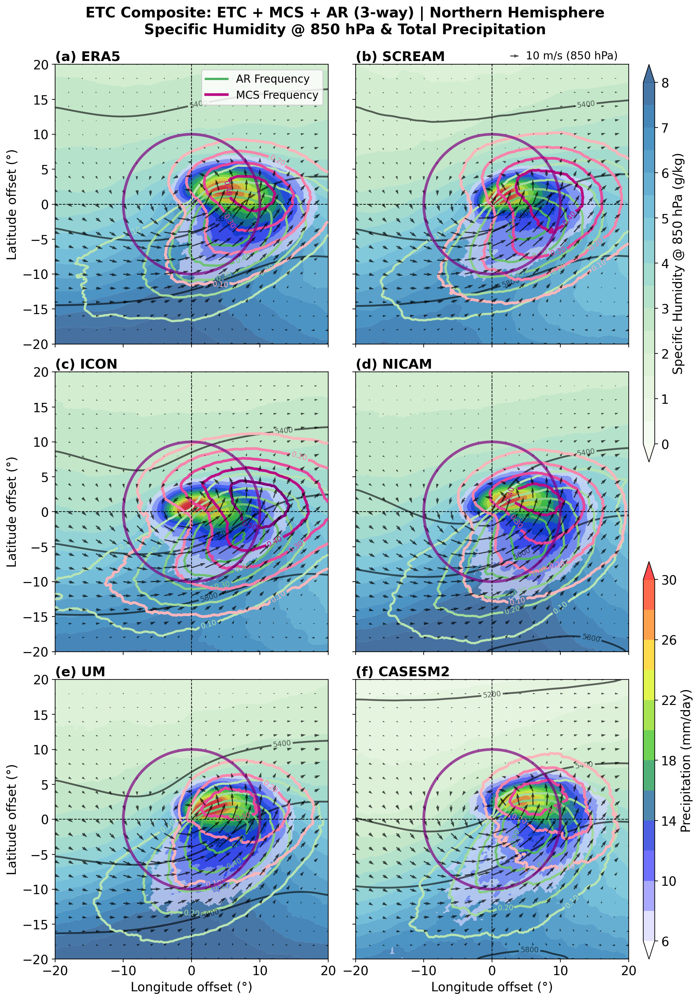

In [7]:
figname = f'{figdir}etc_composite_multipanel_{hemisphere}_{overlap_type}_hus_pr.pdf'
suptitle = f'ETC Composite: {overlap_desc} | {hemisphere_name}\nSpecific Humidity @ 850 hPa & Total Precipitation'

cmap_ct2 = truncate_colormap(mpl.colormaps.get_cmap('Greens'), 0.3, 0.8)
cmap_ct3 = truncate_colormap(mpl.colormaps.get_cmap('RdPu'),   0.3, 1.0)

contour_var = 'zg_500hPa'

if overlap_type == 'all':
    shade_levels  = np.arange(0, 6.1, 0.5)
    shade_levels2 = np.arange(5.0, 16.1, 1.0)
    contour_levels  = np.arange(5000, 6000, 100)
    contour_levels2 = np.arange(0.04, 0.21, 0.02)
    contour_levels3 = np.arange(0.04, 0.21, 0.02)
else:
    shade_levels  = np.arange(0, 8.1, 0.5)
    shade_levels2 = np.arange(6, 30.1, 2)
    contour_levels  = np.arange(4600, 6000, 200)
    contour_levels2 = np.arange(0.1, 0.81, 0.1)
    contour_levels3 = np.arange(0.1, 0.61, 0.1)

if contour_var == 'zg_850hPa':
    if overlap_type == 'all':
        contour_levels  = np.arange(1000, 1600, 50)
    else:
        contour_levels  = np.arange(800, 1600, 50)

ds_list    = [datasets[sk] for sk, _ in sources]
src_labels = [sl for _, sl in sources]

fig = plot_etc_composite_multipanel(
    ds_list, src_labels,
    nrows=nrows, ncols=ncols,
    shade_var='hus_850hPa',
    shade_levels=shade_levels,
    shade_cmap='GnBu',
    shade_alpha=0.75,
    shade_label='Specific Humidity @ 850 hPa (g/kg)',
    shade_var2='pr',
    shade_levels2=shade_levels2,
    shade_cmap2=cmaps.WhBlGrYeRe,
    shade_alpha2=0.7,
    shade_label2='Precipitation (mm/day)',
    contour_var=contour_var,
    contour_levels=contour_levels,
    contour_smooth=2,
    contour_lw=2,
    contour_var2='ar_freq',
    contour_var2_legend='AR Frequency',
    contour_levels2=contour_levels2,
    contour_cmap2=cmap_ct2,
    contour_smooth2=0.5,
    contour_lw2=2.5,
    contour_var3='mcs_freq',
    contour_var3_legend='MCS Frequency',
    contour_levels3=contour_levels3,
    contour_cmap3=cmap_ct3,
    contour_smooth3=0.5,
    contour_lw3=3.0,
    u_var='ua_850hPa',
    v_var='va_850hPa',
    vector_skip=8,
    quiver_scale=300,
    quiverkey_length=10,
    quiverkey_unit=' m/s (850 hPa)',
    circle_radius=10.0,
    suptitle=suptitle, title_y=0.93,    
    panel_hspace=0.1, panel_wspace=0.1,
    figsize=(12, 18),
    dpi=200,
    figname=figname,
)
plt.show()

## 6. Plot: Omega + MCS Precipitation

Shading: 500 hPa vertical velocity ω (Pa/s)  
Overlay: MCS precipitation (mm/day)  
Contours: 500 hPa geopotential height  
Contour-3: MCS frequency  
Vectors: 850 hPa moisture flux (qu, qv)

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_etc_composites/multipanel/etc_composite_multipanel_nh_3way_omega_mcs.pdf


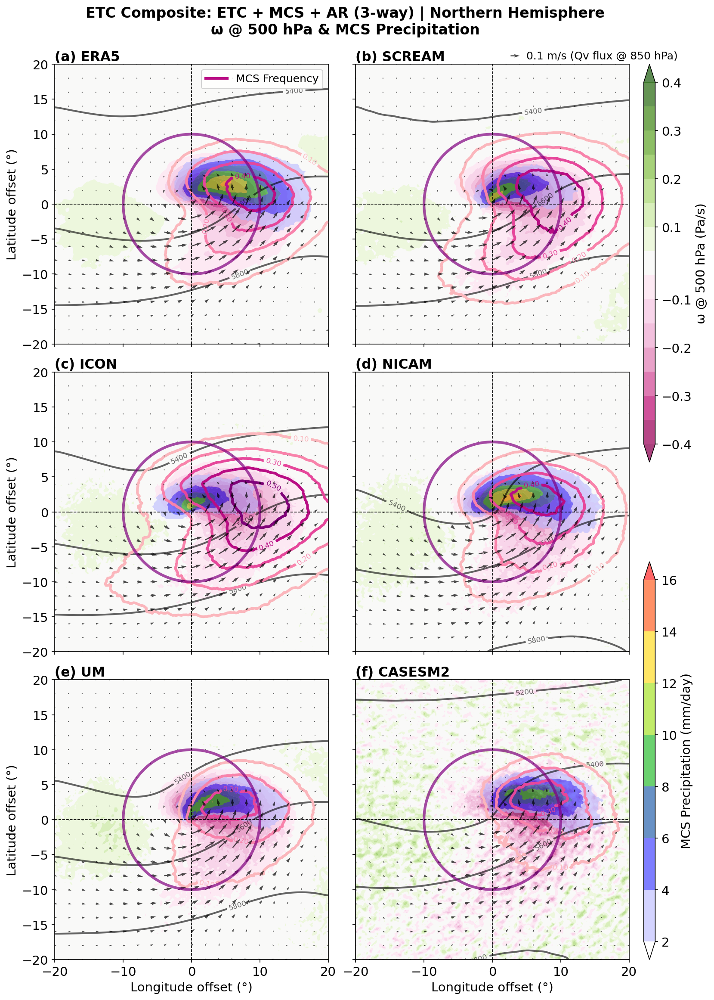

In [27]:
figname = f'{figdir}etc_composite_multipanel_{hemisphere}_{overlap_type}_omega_mcs.pdf'
suptitle = f'ETC Composite: {overlap_desc} | {hemisphere_name}\nω @ 500 hPa & MCS Precipitation'

cmap_ct3 = truncate_colormap(mpl.colormaps.get_cmap('RdPu'), 0.3, 1.0)

shade_levels = np.array([x for x in np.arange(-0.4, 0.41, 0.05) if np.abs(x) > 1e-5])
cbar_ticks   = np.array([x for x in np.arange(-0.4, 0.41, 0.1)  if np.abs(x) > 1e-5])

if overlap_type == 'all':
    shade_levels2   = np.arange(1, 10.1, 1)
    contour_levels  = np.arange(5000, 6000, 100)
    contour_levels3 = np.arange(0.04, 0.21, 0.02)
else:
    shade_levels2   = np.arange(2, 16.1, 2)
    contour_levels  = np.arange(4600, 6000, 200)
    contour_levels3 = np.arange(0.1, 0.61, 0.1)

ds_list    = [datasets[sk] for sk, _ in sources]
src_labels = [sl for _, sl in sources]

fig = plot_etc_composite_multipanel(
    ds_list, src_labels,
    nrows=nrows, ncols=ncols,
    shade_var='omega_500hPa',
    shade_levels=shade_levels,
    cbar_ticks=cbar_ticks,
    shade_cmap='PiYG',
    shade_alpha=0.75,
    shade_label='ω @ 500 hPa (Pa/s)',
    shade_var2='pr_mcs',
    shade_levels2=shade_levels2,
    shade_cmap2=cmaps.WhBlGrYeRe,
    shade_alpha2=0.6,
    shade_label2='MCS Precipitation (mm/day)',
    contour_var='zg_500hPa',
    contour_levels=contour_levels,
    contour_smooth=2,
    contour_lw=2,
    contour_var3='mcs_freq',
    contour_var3_legend='MCS Frequency',
    contour_levels3=contour_levels3,
    contour_cmap3=cmap_ct3,
    contour_smooth3=0.5,
    contour_lw3=3.0,
    u_var='qu_850hPa',
    v_var='qv_850hPa',
    vector_skip=8,
    quiver_scale=3,
    quiverkey_length=0.1,
    quiverkey_unit=' m/s (Qv flux @ 850 hPa)',
    circle_radius=10.0,
    suptitle=suptitle, title_y=0.93,    
    panel_hspace=0.1, panel_wspace=0.1,
    figsize=(12, 18),
    dpi=150,
    figname=figname,
)
plt.show()

## 7. Plot: Omega + AR Precipitation

Shading: 500 hPa vertical velocity ω (Pa/s)  
Overlay: AR precipitation (mm/day)  
Contours: 500 hPa geopotential height  
Contour-2: AR frequency  
Vectors: 850 hPa moisture flux (qu, qv)

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_etc_composites/multipanel/etc_composite_multipanel_nh_3way_omega_ar.pdf


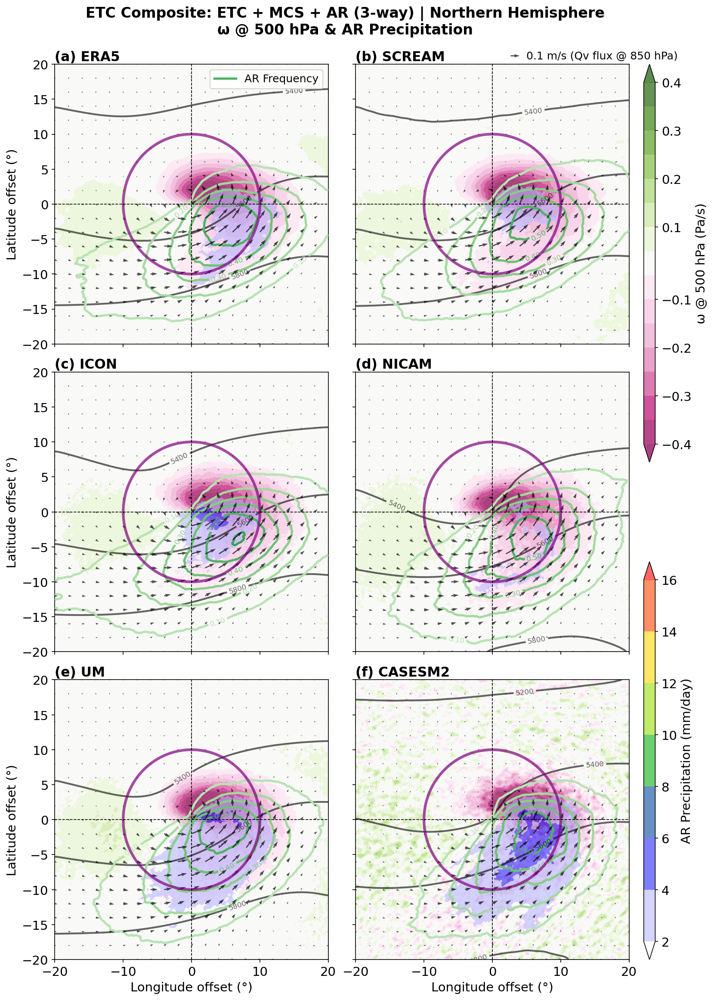

In [28]:
figname = f'{figdir}etc_composite_multipanel_{hemisphere}_{overlap_type}_omega_ar.pdf'
suptitle = f'ETC Composite: {overlap_desc} | {hemisphere_name}\nω @ 500 hPa & AR Precipitation'

cmap_ct2 = truncate_colormap(mpl.colormaps.get_cmap('Greens'), 0.3, 0.8)

shade_levels = np.array([x for x in np.arange(-0.4, 0.41, 0.05) if np.abs(x) > 1e-5])
cbar_ticks   = np.array([x for x in np.arange(-0.4, 0.41, 0.1)  if np.abs(x) > 1e-5])

if overlap_type == 'all':
    shade_levels2   = np.arange(1, 10.1, 1)
    contour_levels  = np.arange(5000, 6000, 100)
    contour_levels2 = np.arange(0.04, 0.21, 0.02)
else:
    shade_levels2   = np.arange(2, 16.1, 2)
    contour_levels  = np.arange(4600, 6000, 200)
    contour_levels2 = np.arange(0.1, 0.81, 0.1)

ds_list    = [datasets[sk] for sk, _ in sources]
src_labels = [sl for _, sl in sources]

fig = plot_etc_composite_multipanel(
    ds_list, src_labels,
    nrows=nrows, ncols=ncols,
    shade_var='omega_500hPa',
    shade_levels=shade_levels,
    cbar_ticks=cbar_ticks,
    shade_cmap='PiYG',
    shade_alpha=0.75,
    shade_label='ω @ 500 hPa (Pa/s)',
    shade_var2='pr_ar',
    shade_levels2=shade_levels2,
    shade_cmap2=cmaps.WhBlGrYeRe,
    shade_alpha2=0.6,
    shade_label2='AR Precipitation (mm/day)',
    contour_var='zg_500hPa',
    contour_levels=contour_levels,
    contour_smooth=2,
    contour_lw=2,
    contour_var2='ar_freq',
    contour_var2_legend='AR Frequency',
    contour_levels2=contour_levels2,
    contour_cmap2=cmap_ct2,
    contour_smooth2=0.5,
    contour_lw2=2.5,
    u_var='qu_850hPa',
    v_var='qv_850hPa',
    vector_skip=8,
    quiver_scale=3,
    quiverkey_length=0.1,
    quiverkey_unit=' m/s (Qv flux @ 850 hPa)',
    circle_radius=10.0,
    suptitle=suptitle, title_y=0.93,    
    panel_hspace=0.1, panel_wspace=0.1,
    figsize=(12, 18),
    dpi=150,
    figname=figname,
)
plt.show()

## 8. Plot: Moisture Flux Magnitude + MCS Precipitation Fraction

Shading: 850 hPa moisture flux magnitude (kg/kg·m/s)  
Overlay: MCS precipitation fraction (%)  
Contours: 500 hPa geopotential height  
Contour-3: ω @ 500 hPa (via cmap_ct3)  
Vectors: 850 hPa moisture flux (qu, qv)

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_etc_composites/multipanel/etc_composite_multipanel_nh_3way_qmag_mcsrainfrac_omegact.pdf


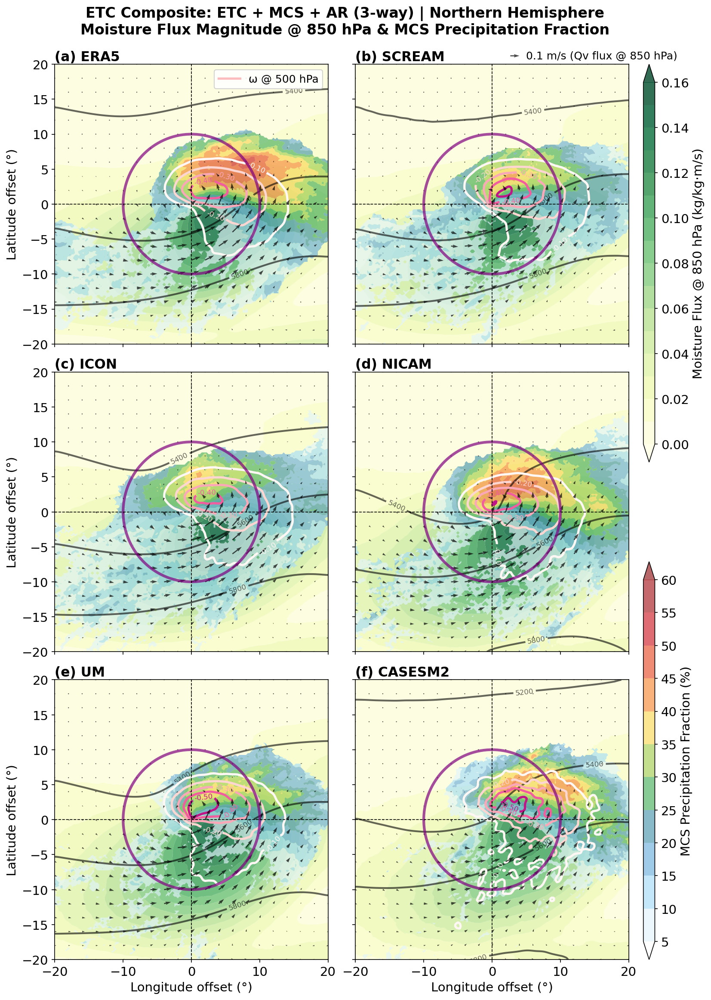

In [29]:
figname = f'{figdir}etc_composite_multipanel_{hemisphere}_{overlap_type}_qmag_mcsrainfrac_omegact.pdf'
suptitle = f'ETC Composite: {overlap_desc} | {hemisphere_name}\nMoisture Flux Magnitude @ 850 hPa & MCS Precipitation Fraction'

cmap_ct3 = truncate_colormap(mpl.colormaps.get_cmap('RdPu_r'), 0.3, 1.0)

shade_levels  = np.arange(0, 0.161, 0.01)
cbar_ticks    = np.arange(0, 0.161, 0.02)
shade_levels2 = np.arange(5, 61, 5)
cbar_ticks2   = np.arange(5, 61, 5)

# omega contour levels: ~6 levels skipping zero
contour_levels3 = np.array([-0.5, -0.4, -0.3, -0.2, -0.1])  # Pa/s

if overlap_type == 'all':
    contour_levels  = np.arange(5000, 6000, 100)
    # contour_levels  = np.arange(1000, 1600, 100)
else:
    contour_levels  = np.arange(4600, 6000, 200)
    # contour_levels  = np.arange(800, 1600, 100)

ds_list    = [datasets[sk] for sk, _ in sources]
src_labels = [sl for _, sl in sources]

fig = plot_etc_composite_multipanel(
    ds_list, src_labels,
    nrows=nrows, ncols=ncols,
    shade_var='qmag_850hPa',
    shade_levels=shade_levels,
    cbar_ticks=cbar_ticks,
    shade_cmap='YlGn',
    shade_alpha=0.8,
    shade_label='Moisture Flux @ 850 hPa (kg/kg·m/s)',
    shade_var2='prfrac_mcs',
    shade_levels2=shade_levels2,
    cbar_ticks2=cbar_ticks2,
    shade_cmap2=cmaps.WhiteBlueGreenYellowRed,
    shade_alpha2=0.65,
    shade_label2='MCS Precipitation Fraction (%)',
    contour_var='zg_500hPa',
    contour_levels=contour_levels,
    contour_smooth=2,
    contour_lw=2,
    contour_var3='omega_500hPa',
    contour_var3_legend='ω @ 500 hPa',
    contour_levels3=contour_levels3,
    contour_cmap3=cmap_ct3,
    contour_smooth3=1.5,
    contour_lw3=2.5,
    u_var='qu_850hPa',
    v_var='qv_850hPa',
    vector_skip=8,
    quiver_scale=3,
    quiverkey_length=0.1,
    quiverkey_unit=' m/s (Qv flux @ 850 hPa)',
    circle_radius=10.0,
    suptitle=suptitle, title_y=0.93,    
    panel_hspace=0.1, panel_wspace=0.1,
    figsize=(12, 18),
    dpi=150,
    figname=figname,
)
plt.show()

## 9. Plot: Omega + AR Precipitation Fraction

Shading: 500 hPa vertical velocity ω (Pa/s)  
Overlay: AR precipitation fraction (%)  
Contours: 500 hPa geopotential height  
Contour-3: ω @ 500 hPa (via cmap_ct3)  
Vectors: 850 hPa moisture flux (qu, qv)

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_etc_composites/multipanel/etc_composite_multipanel_nh_3way_omega_mcsrainfrac_omegact.pdf


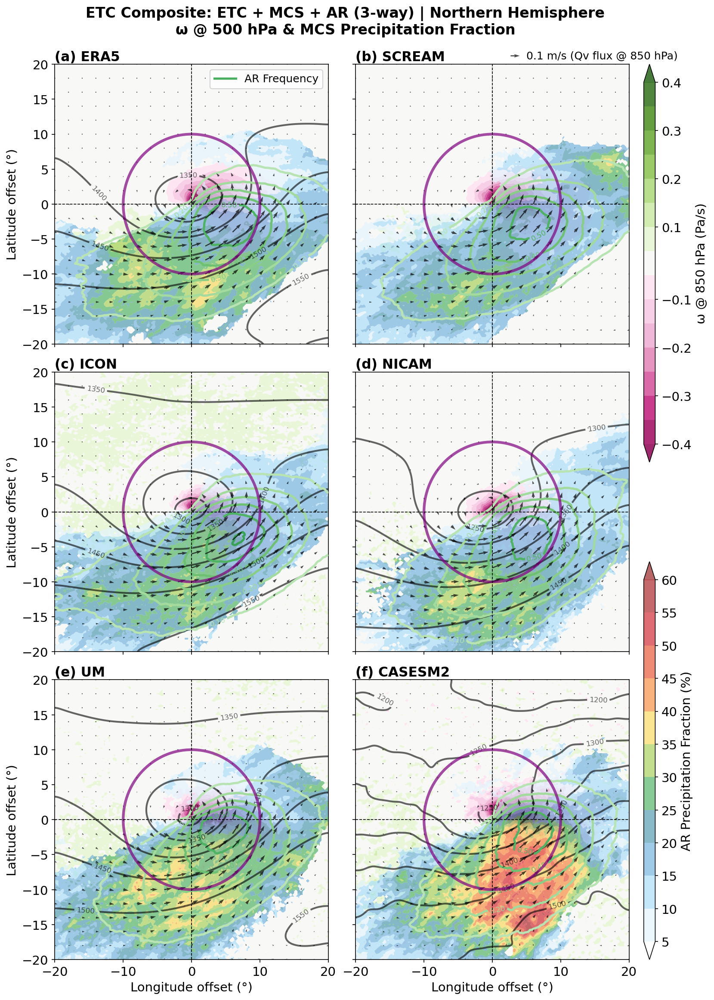

In [30]:
figname = f'{figdir}etc_composite_multipanel_{hemisphere}_{overlap_type}_omega_mcsrainfrac_omegact.pdf'
suptitle = f'ETC Composite: {overlap_desc} | {hemisphere_name}\nω @ 500 hPa & MCS Precipitation Fraction'

cmap_ct3 = truncate_colormap(mpl.colormaps.get_cmap('RdPu'), 0.3, 1.0)

shade_levels  = np.array([x for x in np.arange(-0.4, 0.41, 0.05) if np.abs(x) > 1e-5])
cbar_ticks    = np.array([x for x in np.arange(-0.4, 0.41, 0.1)  if np.abs(x) > 1e-5])
shade_levels2 = np.arange(5, 61, 5)
cbar_ticks2   = np.arange(5, 61, 5)

# omega contour levels: ~6 levels skipping zero
contour_levels3 = np.array([-0.3, -0.2, -0.1, 0.1, 0.2, 0.3])  # Pa/s

if overlap_type == 'all':
    # contour_levels  = np.arange(5000, 6000, 100)
    contour_levels  = np.arange(1000, 1600, 50)
else:
    # contour_levels  = np.arange(4600, 6000, 200)
    contour_levels  = np.arange(800, 1600, 50)

ds_list    = [datasets[sk] for sk, _ in sources]
src_labels = [sl for _, sl in sources]

fig = plot_etc_composite_multipanel(
    ds_list, src_labels,
    nrows=nrows, ncols=ncols,
    shade_var='omega_850hPa',
    shade_levels=shade_levels,
    cbar_ticks=cbar_ticks,
    shade_cmap='PiYG',
    shade_alpha=0.85,
    shade_label='ω @ 850 hPa (Pa/s)',
    shade_var2='prfrac_ar',
    shade_levels2=shade_levels2,
    cbar_ticks2=cbar_ticks2,
    shade_cmap2=cmaps.WhiteBlueGreenYellowRed,
    shade_alpha2=0.65,
    shade_label2='AR Precipitation Fraction (%)',
    contour_var='zg_850hPa',
    contour_levels=contour_levels,
    contour_smooth=2.5,
    contour_lw=2,
    contour_var2='ar_freq',
    contour_var2_legend='AR Frequency',
    contour_levels2=contour_levels2,
    contour_cmap2=cmap_ct2,
    contour_smooth2=0.5,
    contour_lw2=2.5,
    u_var='qu_850hPa',
    v_var='qv_850hPa',
    vector_skip=8,
    quiver_scale=3,
    quiverkey_length=0.1,
    quiverkey_unit=' m/s (Qv flux @ 850 hPa)',
    circle_radius=10.0,
    suptitle=suptitle, title_y=0.93,    
    panel_hspace=0.1, panel_wspace=0.1,
    figsize=(12, 18),
    dpi=150,
    figname=figname,
)
plt.show()